# Analyzing the clusters
In the previous notebooks, we have been through the process of Data cleaning, gathering the behaviour of the stations on weekdays, adding geolocation data and finally classifying them by clusters. Now it is time to understand why the model has classified these clusters this way, and understand what do the stations of each cluster have in common.

In [27]:
#importing needed libraries
import pandas as pd
import plotly.graph_objs as go
import plotly.express as px
from IPython.core.display import SVG
from IPython.display import Image
pd.set_option('display.max_columns', None)

In [2]:
#Reading the generated, clustered data
clusters = pd.read_csv("..\\Dataset\\clusters.csv",encoding="utf_8",decimal=',', sep=';')

In [3]:
clusters.head()

,station_id,00:00,01:00,02:00,03:00,04:00,05:00,06:00,07:00,08:00,09:00,10:00,11:00,12:00,13:00,14:00,15:00,16:00,17:00,18:00,19:00,20:00,21:00,22:00,23:00,capacity,lat,long,DisttoCentre,labels,labelsPCA
0,1,78.0,79.0,79.0,80.0,79.0,70.0,39.0,13.0,17.0,20.0,26.0,28.0,34.0,35.0,37.0,36.0,31.0,37.0,40.0,42.0,53.0,59.0,67.0,73.0,30,41.397952,2.180042,1.47,4,4
1,2,50.0,52.0,51.0,50.0,50.0,44.0,27.0,13.0,12.0,16.0,14.0,19.0,25.0,33.0,38.0,42.0,40.0,31.0,26.0,27.0,33.0,38.0,46.0,47.0,27,41.395530,2.177060,1.11,5,3
2,3,61.0,62.0,62.0,62.0,61.0,62.0,53.0,29.0,15.0,13.0,18.0,23.0,41.0,51.0,54.0,58.0,66.0,69.0,72.0,68.0,61.0,60.0,61.0,64.0,27,41.394055,2.181299,1.22,4,4
3,4,47.0,46.0,47.0,49.0,55.0,67.0,48.0,23.0,10.0,13.0,23.0,32.0,46.0,54.0,63.0,63.0,64.0,72.0,74.0,64.0,55.0,46.0,46.0,50.0,21,41.393480,2.181555,1.20,4,4
4,5,63.0,63.0,62.0,61.0,62.0,59.0,48.0,24.0,21.0,26.0,29.0,28.0,29.0,32.0,37.0,40.0,49.0,67.0,78.0,69.0,69.0,70.0,69.0,64.0,39,41.391075,2.180223,0.96,4,4


In [4]:
clusters.labels.value_counts()

2    101
5     81
4     80
1     79
3     67
Name: labels, dtype: int64

There are 5 different clusters, where 4 of them have similar values (67-81) and one has 101 stations. Let's try to understand one by one what do they have in common.

In [5]:
#Grouping the density columns by hours as a list for easy manipulation
hours = ['00:00', '01:00', '02:00', '03:00', '04:00', '05:00',
       '06:00', '07:00', '08:00', '09:00', '10:00', '11:00', '12:00', '13:00',
       '14:00', '15:00', '16:00', '17:00', '18:00', '19:00', '20:00', '21:00',
       '22:00', '23:00']

In [6]:
clu_means = clusters.groupby('labels',as_index=False).mean().round(decimals=2)

In [7]:
clu_means

,labels,station_id,00:00,01:00,02:00,03:00,04:00,05:00,06:00,07:00,08:00,09:00,10:00,11:00,12:00,13:00,14:00,15:00,16:00,17:00,18:00,19:00,20:00,21:00,22:00,23:00,capacity,lat,long,DisttoCentre,labelsPCA
0,1,194.63,54.91,50.92,46.16,41.76,39.01,37.73,43.03,56.58,66.24,69.16,68.99,67.43,65.13,65.87,67.05,65.94,62.92,62.03,62.67,62.58,64.57,64.94,63.27,60.04,26.16,41.40,2.19,2.69,1.00
1,2,215.38,11.87,13.92,16.12,19.17,20.89,19.03,15.27,13.91,15.13,15.10,14.61,13.95,10.68,8.25,8.75,9.51,9.33,10.19,11.37,11.79,12.02,11.18,10.04,10.18,23.53,41.40,2.15,2.75,5.00
2,3,205.64,15.15,14.28,13.57,13.34,14.87,26.30,55.25,76.25,81.93,79.52,74.40,65.03,54.36,48.84,44.58,35.52,23.64,18.70,16.51,15.43,16.16,16.21,15.55,15.07,28.24,41.39,2.18,2.22,1.97
3,4,212.01,82.28,82.25,81.96,80.84,78.00,65.88,41.62,24.64,22.29,23.29,25.72,31.05,40.41,47.61,51.99,55.49,61.65,66.92,70.74,74.20,76.16,78.10,80.88,83.36,26.76,41.40,2.18,2.74,4.00
4,5,244.60,48.51,53.43,57.51,60.01,59.10,45.90,25.32,14.69,13.05,13.26,13.90,15.06,15.06,14.64,14.33,14.78,16.35,17.81,20.58,25.07,29.44,31.28,34.51,40.33,24.20,41.40,2.16,3.10,3.00


In [8]:
clu_means.drop(columns=['station_id','capacity','lat','long','DisttoCentre','labelsPCA','labels'],inplace=True)

In [9]:
clu_means = clu_means.transpose()

# The visuals: Plots, maps and analysis

In [10]:
fig = go.Figure(
        data=[
             go.Scatter(x=clu_means.index, 
                       y=clu_means[0],
                       mode='lines',
                       name='Cluster 1',
                       line = dict(
                           width = 6,
                           color = 'rgb(51,96,140)')),
             go.Scatter(x=clu_means.index, 
                       y=clu_means[1],
                       mode='lines',
                       name='Cluster 2',
                       line = dict(
                           width = 6,
                           color = 'rgb(195,106,156)')),
            go.Scatter(x=clu_means.index, 
                       y=clu_means[2],
                       mode='lines',
                       name='Cluster 3',
                       line = dict(
                           width = 6,
                           color = 'rgb(246,186,87)')),
            go.Scatter(x=clu_means.index, 
                       y=clu_means[3],
                       mode='lines',
                       name='Cluster 4',
                       line = dict(
                           width = 6,
                           color = 'rgb(228,96,72)')),
            go.Scatter(x=clu_means.index, 
                       y=clu_means[4],
                       mode='lines',
                       name='Cluster 5',
                       line = dict(
                           width = 6,
                           color = 'rgb(184,24,64)')),
            
        ],
        layout=go.Layout(
            title=dict(text='Clusters Workdays hourly behaviour'),
            xaxis=dict(title='Hours'),
            yaxis=dict(title='% of bike occupation')))

fig.add_trace(go.Scatter(x=['06:00','06:00'], y=[10,90], mode="lines", name="Morning rush hour start",line = dict(
                           width = 3,
                           color = 'rgb(0,0,0)')))
fig.add_trace(go.Scatter(x=['09:00','09:00'], y=[10,90], mode="lines", name="Morning rush hour finish",line = dict(
                           width = 3,
                           color = 'rgb(0,0,0)')))
fig.add_trace(go.Scatter(x=['16:00','16:00'], y=[10,90], mode="lines", name="Evening rush hour",line = dict(
                           width = 3,
                           color = 'rgb(0,0,0)')))

In [28]:
fig.write_image("..//plots_maps//clusters_plot.svg")

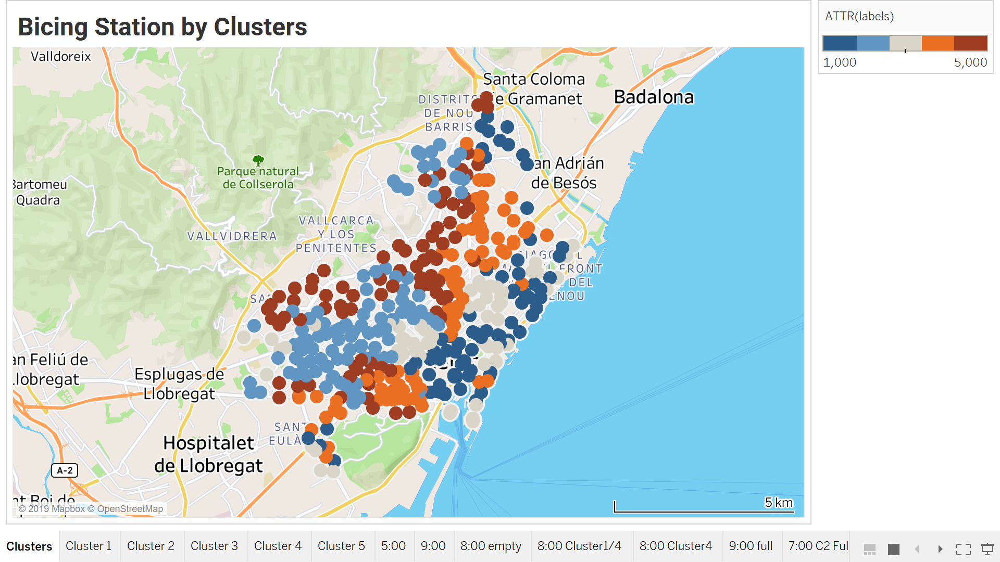

In [29]:
Image("..//plots_maps//clusters_map.png")

#### First insights:
* Cluster 1: Stations to be half-full at most part of the day, but generally do not get completely full. Map locates the stations of this cluster below Gran Via and Meridiana, generally in pretty dense and busy areas.
* Cluster 2: Stations of cluster 3 tend to be empty throughout most part of the day. This could be because of the higher elevation of these stations, and also because there might be areas where users tend to take bikes very fast.
* Cluster 3: Stations from this cluster behave as work/educational locations. At morning rush hour the tendency is to get filled by bikes and then it slowly gets empty towards the end of the day. Map proves that they are located near office/university areas.
* Cluster 4: Stations that behave as moderate Residentials, getting emptier at morning rush hour and slowly increasing the % of bikes. Especially located in Sants/Eixample/Sant Andreu/Gràcia.
* Cluster 5: Stations behave as extreme residential locations with more extreme behavior than, for example, Cluster 4. This is due to the fact that these stations are located at areas of Barcelona which have low elevation and purely residential.


# Cluster 1: Crowded, old-town stations
#### Summary extracted after seeing the cells below:
* 79 stations
* Distance to the city centre is not relevant
* Located in busy, commercial areas of the city, especially Ciutat Vella
* Stable behaviour towards the day
* Generally half-full stations. Easy to find bikes/spots any time of the day.
* Standard deviation around 15 points, which initially make this cluster quite consistent.

In [14]:
fig2 = go.Figure(
        data=[
             go.Scatter(x=clu_means.index, 
                       y=clu_means[0],
                       mode='lines',
                       name='Cluster 1',
                       line = dict(
                           width = 6,
                           color = 'rgb(51,96,140)')),
            
        ],
        layout=go.Layout(
            title=dict(text='Cluster 1 Workdays hourly behaviour'),
            xaxis=dict(title='Hours'),
            yaxis=dict(title='% of bike occupation')))

fig2.add_trace(go.Scatter(x=['06:00','06:00'], y=[10,90], mode="lines", name="Morning rush hour start",line = dict(
                           width = 3,
                           color = 'rgb(0,0,0)')))
fig2.add_trace(go.Scatter(x=['09:00','09:00'], y=[10,90], mode="lines", name="Morning rush hour finish",line = dict(
                           width = 3,
                           color = 'rgb(0,0,0)')))
fig2.add_trace(go.Scatter(x=['16:00','16:00'], y=[10,90], mode="lines", name="Evening rush hour",line = dict(
                           width = 3,
                           color = 'rgb(0,0,0)')))

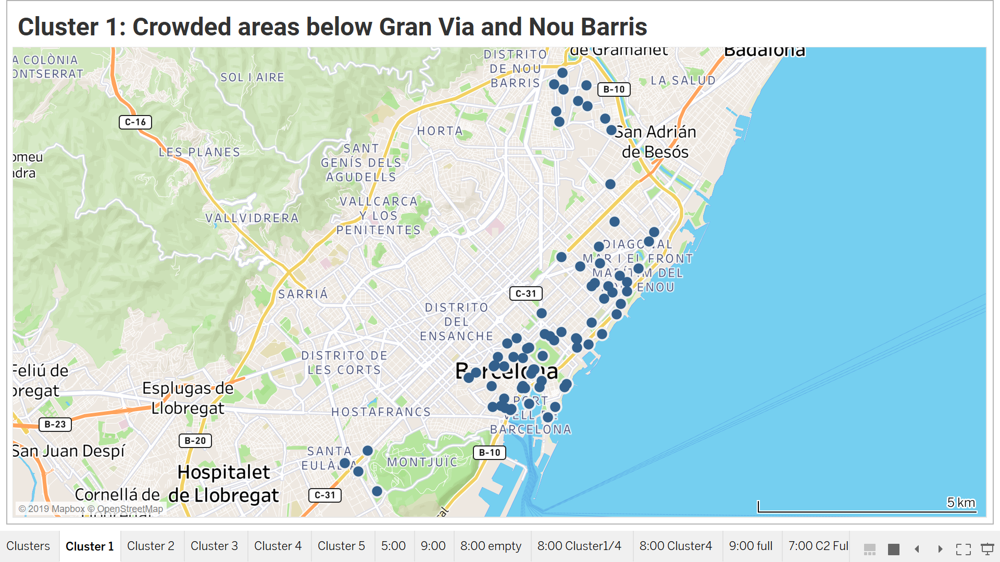

In [12]:
Image("..//plots_maps//cluster1_map.png")

In [13]:
clusters[clusters.labels == 1].describe()

,station_id,00:00,01:00,02:00,03:00,04:00,05:00,06:00,07:00,08:00,09:00,10:00,11:00,12:00,13:00,14:00,15:00,16:00,17:00,18:00,19:00,20:00,21:00,22:00,23:00,capacity,lat,long,DisttoCentre,labels,labelsPCA
count,79.000000,79.000000,79.000000,79.000000,79.000000,79.000000,79.000000,79.000000,79.000000,79.000000,79.000000,79.000000,79.000000,79.000000,79.000000,79.000000,79.000000,79.000000,79.000000,79.000000,79.000000,79.000000,79.000000,79.000000,79.000000,79.000000,79.000000,79.000000,79.000000,79.0,79.0
mean,194.632911,54.911392,50.924051,46.164557,41.759494,39.012658,37.734177,43.025316,56.582278,66.240506,69.164557,68.987342,67.430380,65.126582,65.873418,67.050633,65.936709,62.924051,62.025316,62.670886,62.582278,64.569620,64.936709,63.265823,60.037975,26.164557,41.395621,2.188602,2.685696,1.0,1.0
std,134.886294,14.908430,15.583334,17.021427,18.265292,18.627588,17.949865,18.913416,18.396354,16.542265,14.196813,12.959991,12.498906,13.099586,12.715191,11.137715,11.248181,14.964721,17.859835,17.044227,15.251404,13.601172,13.878910,14.687958,14.561490,7.042782,0.020592,0.017023,1.821091,0.0,0.0
min,7.000000,20.000000,20.000000,17.000000,13.000000,11.000000,12.000000,7.000000,13.000000,26.000000,30.000000,33.000000,33.000000,22.000000,31.000000,31.000000,27.000000,16.000000,13.000000,16.000000,24.000000,38.000000,38.000000,33.000000,28.000000,15.000000,41.359496,2.133087,0.340000,1.0,1.0
25%,57.500000,43.500000,39.500000,32.000000,29.500000,27.000000,24.000000,29.000000,43.000000,54.500000,58.000000,62.000000,61.500000,57.500000,58.500000,59.500000,59.500000,55.500000,51.500000,52.500000,52.500000,53.500000,54.500000,53.500000,50.500000,21.000000,41.381465,2.179761,1.220000,1.0,1.0
50%,165.000000,57.000000,52.000000,46.000000,41.000000,35.000000,34.000000,42.000000,60.000000,67.000000,72.000000,70.000000,70.000000,66.000000,67.000000,70.000000,67.000000,65.000000,65.000000,64.000000,63.000000,62.000000,62.000000,62.000000,61.000000,27.000000,41.390021,2.190623,2.080000,1.0,1.0
75%,342.000000,65.000000,61.500000,57.500000,54.000000,52.000000,53.000000,57.500000,72.500000,80.500000,80.000000,78.500000,77.000000,74.500000,75.500000,75.000000,74.500000,73.000000,75.500000,76.000000,74.000000,75.500000,78.000000,76.000000,71.000000,27.000000,41.403234,2.200770,3.730000,1.0,1.0
max,418.000000,84.000000,85.000000,85.000000,83.000000,83.000000,82.000000,85.000000,88.000000,90.000000,91.000000,88.000000,88.000000,88.000000,88.000000,88.000000,87.000000,89.000000,91.000000,91.000000,90.000000,89.000000,90.000000,91.000000,90.000000,54.000000,41.445705,2.217994,6.790000,1.0,1.0


# Cluster 2: Low occupation / high demand stations
#### Summary extracted after seeing the cells below:

* 101 stations, the largest one
* Avinguda Diagonal is the linear regression of this cluster
* Low occupation of the stations of the cluster throughout the day, easy to leave bikes but hard to find them. It can indicate a high demand to take bikes when they are left at the station.
* Located in elevated parts of the city.
* Standard deviation around 10 points, pretty consistent.

In [15]:
fig3 = go.Figure(
        data=[
             go.Scatter(x=clu_means.index, 
                       y=clu_means[1],
                       mode='lines',
                       name='Cluster 2',
                       line = dict(
                           width = 6,
                           color = 'rgb(195,106,156)')),
            
        ],
        layout=go.Layout(
            title=dict(text='Cluster 2 Workdays hourly behaviour'),
            xaxis=dict(title='Hours'),
            yaxis=dict(title='% of bike occupation')))

fig3.add_trace(go.Scatter(x=['06:00','06:00'], y=[10,90], mode="lines", name="Morning rush hour start",line = dict(
                           width = 3,
                           color = 'rgb(0,0,0)')))
fig3.add_trace(go.Scatter(x=['09:00','09:00'], y=[10,90], mode="lines", name="Morning rush hour finish",line = dict(
                           width = 3,
                           color = 'rgb(0,0,0)')))
fig3.add_trace(go.Scatter(x=['16:00','16:00'], y=[10,90], mode="lines", name="Evening rush hour",line = dict(
                           width = 3,
                           color = 'rgb(0,0,0)')))

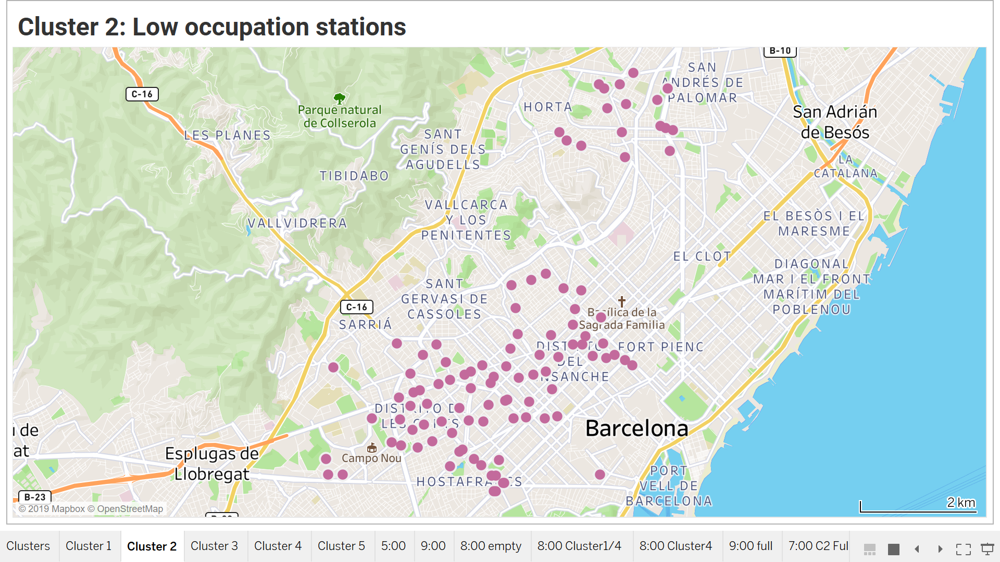

In [16]:
Image("..//plots_maps//cluster2_map.png")

In [17]:
clusters[clusters.labels == 2].describe()

,station_id,00:00,01:00,02:00,03:00,04:00,05:00,06:00,07:00,08:00,09:00,10:00,11:00,12:00,13:00,14:00,15:00,16:00,17:00,18:00,19:00,20:00,21:00,22:00,23:00,capacity,lat,long,DisttoCentre,labels,labelsPCA
count,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.000000,101.0,101.0
mean,215.376238,11.871287,13.920792,16.118812,19.168317,20.891089,19.029703,15.267327,13.910891,15.128713,15.099010,14.613861,13.950495,10.683168,8.247525,8.752475,9.514851,9.326733,10.188119,11.366337,11.792079,12.019802,11.178218,10.039604,10.178218,23.534653,41.396637,2.151953,2.745545,2.0,5.0
std,111.564945,9.910261,11.106469,12.713998,15.089778,16.115149,12.536710,10.846097,12.486872,14.450373,13.952423,12.693282,10.762320,7.042628,6.114582,6.757819,7.956901,7.970080,7.843103,7.730101,8.107178,8.373745,8.045366,8.081981,8.815210,4.801176,0.017879,0.017408,1.384544,0.0,0.0
min,15.000000,0.000000,0.000000,0.000000,1.000000,1.000000,3.000000,2.000000,1.000000,1.000000,1.000000,1.000000,2.000000,1.000000,2.000000,2.000000,1.000000,0.000000,1.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000,12.000000,41.374213,2.113505,0.770000,2.0,5.0
25%,102.000000,3.000000,4.000000,5.000000,7.000000,9.000000,11.000000,8.000000,5.000000,5.000000,5.000000,6.000000,7.000000,6.000000,4.000000,4.000000,4.000000,4.000000,5.000000,6.000000,5.000000,5.000000,4.000000,3.000000,3.000000,21.000000,41.385081,2.139124,1.650000,2.0,5.0
50%,209.000000,9.000000,11.000000,12.000000,16.000000,19.000000,17.000000,12.000000,10.000000,10.000000,10.000000,10.000000,11.000000,9.000000,6.000000,8.000000,8.000000,7.000000,8.000000,10.000000,10.000000,10.000000,10.000000,7.000000,7.000000,23.000000,41.392278,2.150783,2.410000,2.0,5.0
75%,296.000000,18.000000,24.000000,27.000000,28.000000,27.000000,23.000000,20.000000,20.000000,21.000000,23.000000,19.000000,16.000000,13.000000,10.000000,11.000000,11.000000,12.000000,12.000000,15.000000,18.000000,19.000000,17.000000,16.000000,17.000000,27.000000,41.399945,2.166022,3.480000,2.0,5.0
max,495.000000,33.000000,37.000000,52.000000,64.000000,72.000000,70.000000,60.000000,60.000000,61.000000,64.000000,58.000000,53.000000,37.000000,37.000000,39.000000,49.000000,54.000000,47.000000,38.000000,38.000000,33.000000,34.000000,32.000000,33.000000,36.000000,41.438864,2.184898,5.790000,2.0,5.0


# Cluster 3: Office and University hubs
#### Summary extracted after seeing the cells below:

* 67 stations
* Located in office and University hubs
* Strong need of bike spots in morning rush hour, especially from 7:00 to 9:00, then the number of bikes slowly drops
* Generally half-empty stations. Easy to leave a bike but difficult to find them around 9:00. 
* Stations located in different areas of the city, not a particular one.
* Standard deviation around below 15 points, which makes it very consistent.

In [18]:
fig4 = go.Figure(
        data=[
             go.Scatter(x=clu_means.index, 
                       y=clu_means[2],
                       mode='lines',
                       name='Cluster 3',
                       line = dict(
                           width = 6,
                           color = 'rgb(246,186,87)')),
            
        ],
        layout=go.Layout(
            title=dict(text='Cluster 3 Workdays hourly behaviour'),
            xaxis=dict(title='Hours'),
            yaxis=dict(title='% of bike occupation')))

fig4.add_trace(go.Scatter(x=['06:00','06:00'], y=[10,90], mode="lines", name="Morning rush hour start",line = dict(
                           width = 3,
                           color = 'rgb(0,0,0)')))
fig4.add_trace(go.Scatter(x=['09:00','09:00'], y=[10,90], mode="lines", name="Morning rush hour finish",line = dict(
                           width = 3,
                           color = 'rgb(0,0,0)')))
fig4.add_trace(go.Scatter(x=['16:00','16:00'], y=[10,90], mode="lines", name="Evening rush hour",line = dict(
                           width = 3,
                           color = 'rgb(0,0,0)')))

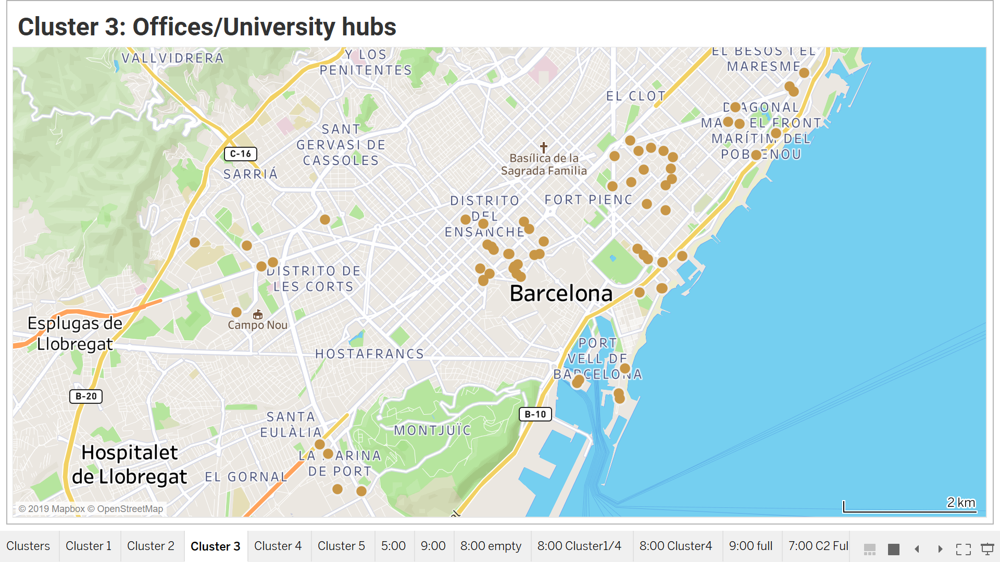

In [19]:
Image("..//plots_maps//Cluster3_map.png")

In [20]:
clusters[clusters.labels == 3].describe()

,station_id,00:00,01:00,02:00,03:00,04:00,05:00,06:00,07:00,08:00,09:00,10:00,11:00,12:00,13:00,14:00,15:00,16:00,17:00,18:00,19:00,20:00,21:00,22:00,23:00,capacity,lat,long,DisttoCentre,labels,labelsPCA
count,67.000000,67.000000,67.000000,67.000000,67.000000,67.000000,67.000000,67.000000,67.000000,67.000000,67.000000,67.000000,67.000000,67.000000,67.000000,67.000000,67.000000,67.000000,67.000000,67.000000,67.000000,67.000000,67.000000,67.000000,67.000000,67.000000,67.000000,67.000000,67.000000,67.0,67.000000
mean,205.641791,15.149254,14.283582,13.567164,13.343284,14.865672,26.298507,55.253731,76.253731,81.925373,79.522388,74.402985,65.029851,54.358209,48.835821,44.582090,35.522388,23.641791,18.701493,16.507463,15.432836,16.164179,16.208955,15.552239,15.074627,28.238806,41.390387,2.177589,2.221194,3.0,1.970149
std,141.291307,14.905006,13.692296,13.412143,12.927012,11.802536,14.900696,18.399887,13.398715,9.155746,8.303629,9.726658,13.220702,17.776134,20.254889,21.481598,20.336084,17.739445,14.834455,12.156022,11.819634,12.334476,13.496955,14.288461,15.755051,7.041198,0.012393,0.026089,1.481069,0.0,0.171460
min,12.000000,0.000000,0.000000,0.000000,0.000000,1.000000,4.000000,21.000000,33.000000,56.000000,58.000000,49.000000,21.000000,11.000000,3.000000,1.000000,0.000000,0.000000,1.000000,1.000000,0.000000,1.000000,1.000000,0.000000,0.000000,15.000000,41.357067,2.111615,0.080000,3.0,1.000000
25%,67.500000,2.000000,2.000000,2.000000,2.500000,5.500000,14.000000,38.000000,70.500000,76.000000,74.000000,66.500000,56.000000,44.000000,38.500000,32.000000,18.500000,9.000000,7.500000,7.000000,6.500000,7.000000,5.500000,4.000000,3.000000,27.000000,41.386481,2.164771,0.620000,3.0,2.000000
50%,160.000000,8.000000,8.000000,7.000000,8.000000,12.000000,26.000000,57.000000,80.000000,84.000000,82.000000,75.000000,66.000000,54.000000,49.000000,47.000000,35.000000,20.000000,14.000000,14.000000,14.000000,13.000000,11.000000,9.000000,7.000000,27.000000,41.389670,2.186711,2.160000,3.0,2.000000
75%,350.000000,28.500000,26.500000,25.000000,22.500000,22.000000,37.000000,69.500000,86.000000,89.000000,85.000000,82.000000,74.000000,68.000000,64.000000,61.500000,50.500000,37.000000,30.000000,23.500000,22.500000,21.000000,25.000000,27.500000,27.500000,31.500000,41.399011,2.195730,3.370000,3.0,2.000000
max,494.000000,50.000000,43.000000,43.000000,55.000000,63.000000,64.000000,86.000000,93.000000,95.000000,95.000000,90.000000,88.000000,84.000000,81.000000,81.000000,75.000000,71.000000,70.000000,52.000000,57.000000,52.000000,53.000000,55.000000,60.000000,54.000000,41.413592,2.221153,5.190000,3.0,2.000000


# Cluster 4: Highly residential
#### Summary extracted after seeing the cells below:
* 80 stations
* Purely residential locations: Poble-Sec, El Clot, Sant Andreu
* Eager to extremes: stations tend to get empty very soon at morning rush hour...
* ... and get full at night, umbalanced demand
* Located in elevated parts of the city.
* Standard deviation around 15 points, fairly consistent.

In [21]:
fig5 = go.Figure(
        data=[
             go.Scatter(x=clu_means.index, 
                       y=clu_means[3],
                       mode='lines',
                       name='Cluster 4',
                       line = dict(
                           width = 6,
                           color = 'rgb(228,96,72)')),
            
        ],
        layout=go.Layout(
            title=dict(text='Cluster 4 Workdays hourly behaviour'),
            xaxis=dict(title='Hours'),
            yaxis=dict(title='% of bike occupation')))

fig5.add_trace(go.Scatter(x=['06:00','06:00'], y=[10,90], mode="lines", name="Morning rush hour start",line = dict(
                           width = 3,
                           color = 'rgb(0,0,0)')))
fig5.add_trace(go.Scatter(x=['09:00','09:00'], y=[10,90], mode="lines", name="Morning rush hour finish",line = dict(
                           width = 3,
                           color = 'rgb(0,0,0)')))
fig5.add_trace(go.Scatter(x=['16:00','16:00'], y=[10,90], mode="lines", name="Evening rush hour",line = dict(
                           width = 3,
                           color = 'rgb(0,0,0)')))

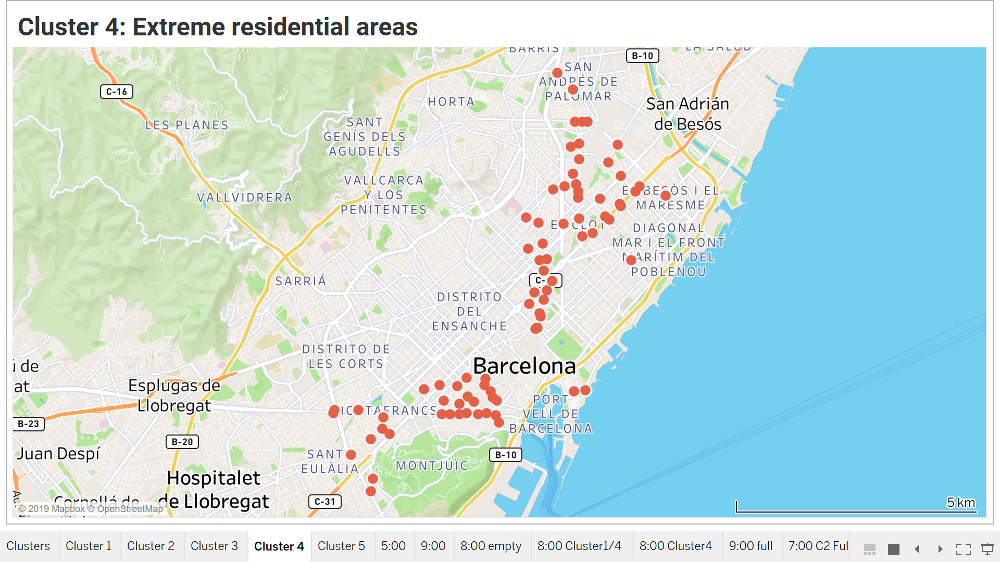

In [22]:
Image("..//plots_maps//Cluster4_map.png")

In [23]:
clusters[clusters.labels == 4].describe()

,station_id,00:00,01:00,02:00,03:00,04:00,05:00,06:00,07:00,08:00,09:00,10:00,11:00,12:00,13:00,14:00,15:00,16:00,17:00,18:00,19:00,20:00,21:00,22:00,23:00,capacity,lat,long,DisttoCentre,labels,labelsPCA
count,80.000000,80.000000,80.000000,80.000000,80.000000,80.000000,80.000000,80.000000,80.000000,80.000000,80.000000,80.000000,80.000000,80.000000,80.000000,80.000000,80.000000,80.00000,80.00000,80.00000,80.000000,80.000000,80.000000,80.00000,80.000000,80.000000,80.000000,80.000000,80.000000,80.0,80.0
mean,212.012500,82.275000,82.250000,81.962500,80.837500,78.000000,65.875000,41.625000,24.637500,22.287500,23.287500,25.725000,31.050000,40.412500,47.612500,51.987500,55.487500,61.65000,66.92500,70.73750,74.200000,76.162500,78.100000,80.87500,83.362500,26.762500,41.397102,2.176535,2.735125,4.0,4.0
std,126.183561,10.345885,10.481448,10.545194,11.052743,11.377304,13.181666,19.063103,18.173039,16.853196,15.707931,14.850287,14.681341,15.162156,15.737156,14.873725,13.894716,13.29614,12.82578,12.33575,10.797796,10.753208,10.683715,10.31697,9.804731,4.311432,0.020558,0.020026,1.419058,0.0,0.0
min,1.000000,43.000000,42.000000,43.000000,44.000000,44.000000,26.000000,6.000000,3.000000,2.000000,3.000000,5.000000,7.000000,10.000000,12.000000,19.000000,23.000000,31.00000,37.00000,40.00000,42.000000,46.000000,46.000000,46.00000,48.000000,17.000000,41.360654,2.129847,0.620000,4.0,4.0
25%,127.750000,77.000000,77.000000,77.000000,76.750000,74.000000,60.000000,25.000000,10.000000,9.000000,11.000000,13.750000,18.750000,28.000000,34.750000,41.000000,46.500000,51.75000,58.00000,65.75000,68.000000,68.750000,70.750000,74.00000,78.750000,25.750000,41.377557,2.163328,1.415000,4.0,4.0
50%,186.500000,84.000000,84.500000,84.000000,83.500000,80.000000,67.000000,40.000000,18.000000,15.500000,20.500000,22.500000,28.500000,39.500000,49.500000,53.500000,58.000000,64.50000,70.50000,73.50000,77.000000,79.000000,80.000000,83.50000,86.500000,27.000000,41.397287,2.181282,2.810000,4.0,4.0
75%,316.250000,90.000000,90.000000,89.250000,89.000000,87.000000,76.000000,54.000000,38.500000,31.250000,32.000000,35.000000,41.250000,52.000000,59.250000,63.000000,64.000000,70.50000,76.00000,79.00000,82.250000,84.000000,86.250000,89.25000,90.250000,27.000000,41.415481,2.191054,3.775000,4.0,4.0
max,427.000000,95.000000,95.000000,95.000000,95.000000,93.000000,88.000000,80.000000,70.000000,66.000000,65.000000,66.000000,69.000000,73.000000,79.000000,83.000000,81.000000,86.00000,86.00000,88.00000,90.000000,93.000000,94.000000,96.00000,97.000000,39.000000,41.439109,2.212658,5.930000,4.0,4.0


# Cluster 5: Moderate Residential
#### Summary extracted after seeing the cells below:
 

* 81 stations
* Located in residential districts (Sants, Eixample, Gràcia and Sant Andreu)
* Availability of bikes drops at morning rush hour and it slowly increases throughout the day
* Generally half-empty stations. Easy to leave a bike but difficult to find them around 9:00. 
* Statiosn located at the middle part of the city, moderate elevation.
* Standard deviation around 15-20 points, which initially make this cluster quite consistent.

In [24]:
fig6 = go.Figure(
        data=[
             go.Scatter(x=clu_means.index, 
                       y=clu_means[4],
                       mode='lines',
                       name='Cluster 5',
                       line = dict(
                           width = 6,
                           color = 'rgb(184,24,64)')),
            
        ],
        layout=go.Layout(
            title=dict(text='Cluster 5 Workdays hourly behaviour'),
            xaxis=dict(title='Hours'),
            yaxis=dict(title='% of bike occupation')))

fig6.add_trace(go.Scatter(x=['06:00','06:00'], y=[10,90], mode="lines", name="Morning rush hour start",line = dict(
                           width = 3,
                           color = 'rgb(0,0,0)')))
fig6.add_trace(go.Scatter(x=['09:00','09:00'], y=[10,90], mode="lines", name="Morning rush hour finish",line = dict(
                           width = 3,
                           color = 'rgb(0,0,0)')))
fig6.add_trace(go.Scatter(x=['16:00','16:00'], y=[10,90], mode="lines", name="Evening rush hour",line = dict(
                           width = 3,
                           color = 'rgb(0,0,0)')))

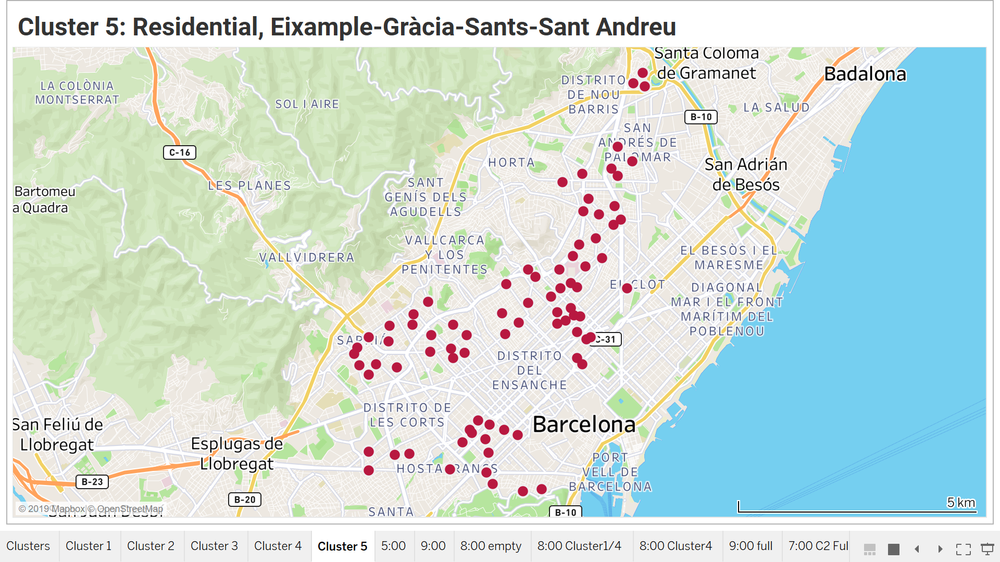

In [25]:
Image("..//plots_maps//cluster5_map.png")

In [26]:
clusters[clusters.labels == 5].describe()

,station_id,00:00,01:00,02:00,03:00,04:00,05:00,06:00,07:00,08:00,09:00,10:00,11:00,12:00,13:00,14:00,15:00,16:00,17:00,18:00,19:00,20:00,21:00,22:00,23:00,capacity,lat,long,DisttoCentre,labels,labelsPCA
count,81.000000,81.000000,81.000000,81.000000,81.000000,81.000000,81.000000,81.000000,81.000000,81.000000,81.000000,81.000000,81.000000,81.000000,81.000000,81.000000,81.000000,81.000000,81.000000,81.000000,81.000000,81.000000,81.000000,81.000000,81.000000,81.000000,81.000000,81.000000,81.000000,81.0,81.0
mean,244.604938,48.506173,53.432099,57.506173,60.012346,59.098765,45.901235,25.320988,14.691358,13.049383,13.259259,13.901235,15.061728,15.061728,14.641975,14.333333,14.777778,16.345679,17.814815,20.580247,25.074074,29.444444,31.283951,34.506173,40.333333,24.197531,41.403956,2.159888,3.103827,5.0,3.0
std,105.723540,14.411040,13.058463,13.770551,15.132328,16.088509,18.675254,20.711607,16.870568,13.692974,12.043440,10.318194,8.906943,9.088930,10.334782,10.383882,10.464225,11.650279,12.891966,14.306348,16.387326,18.681542,20.200393,20.326168,19.169637,4.345744,0.018477,0.021167,1.382894,0.0,0.0
min,2.000000,10.000000,30.000000,29.000000,28.000000,26.000000,14.000000,4.000000,1.000000,1.000000,1.000000,3.000000,3.000000,1.000000,2.000000,2.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.000000,0.000000,1.000000,3.000000,11.000000,41.371515,2.119506,0.950000,5.0,3.0
25%,219.000000,39.000000,42.000000,46.000000,46.000000,46.000000,33.000000,9.000000,5.000000,4.000000,5.000000,7.000000,9.000000,8.000000,6.000000,6.000000,6.000000,7.000000,7.000000,7.000000,7.000000,10.000000,8.000000,24.000000,31.000000,22.000000,41.395274,2.144534,2.020000,5.0,3.0
50%,269.000000,48.000000,55.000000,57.000000,61.000000,58.000000,41.000000,20.000000,7.000000,8.000000,9.000000,11.000000,13.000000,14.000000,12.000000,12.000000,14.000000,16.000000,17.000000,21.000000,26.000000,31.000000,33.000000,35.000000,41.000000,24.000000,41.403054,2.163411,2.890000,5.0,3.0
75%,323.000000,61.000000,63.000000,68.000000,71.000000,70.000000,55.000000,33.000000,16.000000,14.000000,16.000000,17.000000,18.000000,20.000000,19.000000,19.000000,20.000000,24.000000,27.000000,30.000000,35.000000,43.000000,46.000000,51.000000,55.000000,27.000000,41.413425,2.176909,4.010000,5.0,3.0
max,496.000000,77.000000,86.000000,87.000000,93.000000,94.000000,90.000000,81.000000,71.000000,61.000000,59.000000,52.000000,43.000000,40.000000,45.000000,39.000000,48.000000,54.000000,55.000000,56.000000,64.000000,68.000000,69.000000,68.000000,75.000000,33.000000,41.450634,2.192826,7.310000,5.0,3.0


In [21]:
#Visualizing Cluster 3 and 4
fig7 = go.Figure(
        data=[
            go.Scatter(x=clu_means.index, 
                       y=clu_means[2],
                       mode='lines',
                       name='Cluster 3',
                       line = dict(
                           width = 6,
                           color = 'rgb(246,186,87)')),
            go.Scatter(x=clu_means.index, 
                       y=clu_means[3],
                       mode='lines',
                       name='Cluster 4',
                       line = dict(
                           width = 6,
                           color = 'rgb(184,24,64)')),
            
        ],
        layout=go.Layout(
            title=dict(text='Clusters 3/4 hourly behaviour'),
            xaxis=dict(title='Hours'),
            yaxis=dict(title='% of bike occupation')))

fig7.add_trace(go.Scatter(x=['06:00','06:00'], y=[10,90], mode="lines", name="Morning rush hour start",line = dict(
                           width = 3,
                           color = 'rgb(0,0,0)')))
fig7.add_trace(go.Scatter(x=['09:00','09:00'], y=[10,90], mode="lines", name="Morning rush hour finish",line = dict(
                           width = 3,
                           color = 'rgb(0,0,0)')))
fig7.add_trace(go.Scatter(x=['16:00','16:00'], y=[10,90], mode="lines", name="Evening rush hour",line = dict(
                           width = 3,
                           color = 'rgb(0,0,0)')))

In [22]:
#Exporting plots into .svg
fig2.write_image("..//plots_maps//cluster1_plot.svg")
fig3.write_image("..//plots_maps//cluster2_plot.svg")
fig4.write_image("..//plots_maps//cluster3_plot.svg")
fig5.write_image("..//plots_maps//cluster4_plot.svg")
fig6.write_image("..//plots_maps//cluster5_plot.svg")
fig7.write_image("..//plots_maps//cluster_solution_plot.svg")